In [25]:
import pandas as pd
import numpy as np
import pickle, warnings, datetime
import matplotlib.pyplot as plt
from great_tables import GT, md, html
warnings.filterwarnings('ignore')

In [26]:
# Read pickle file containing the DataFrame
# Ensure the path is correct and the file exists
path = '../../Data/Processed/merged_data_202506241445.pkl'
with open(path, 'rb') as file:
    df = pickle.load(file)

In [27]:
df

,AAL_%Chg,ALGT_%Chg,ALK_%Chg,DAL_%Chg,ITA_%Chg,IYT_%Chg,JBLU_%Chg,JETS_%Chg,LUV_%Chg,UAL_%Chg,...,month_of_year_12,hour_of_day_9,hour_of_day_10,hour_of_day_11,hour_of_day_12,hour_of_day_13,hour_of_day_14,hour_of_day_15,is_open,is_close
2018-01-02 09:30:00,0.13,0.52,1.31,0.31,0.08,0.80,0.13,0.68,0.49,0.43,...,False,True,False,False,False,False,False,False,1,0
2018-01-02 09:45:00,0.19,-0.88,0.05,-0.13,-0.12,0.07,-0.25,-0.04,0.43,-0.25,...,False,True,False,False,False,False,False,False,0,0
2018-01-02 10:00:00,-0.08,1.09,0.18,0.22,0.17,0.23,0.27,0.32,-0.18,0.13,...,False,False,True,False,False,False,False,False,0,0
2018-01-02 10:15:00,0.02,-0.03,0.20,0.03,-0.16,-0.29,-0.38,-0.01,-0.27,0.28,...,False,False,True,False,False,False,False,False,0,0
2018-01-02 10:30:00,0.04,-0.74,0.05,0.30,-0.18,-0.09,-0.04,-0.08,0.30,0.24,...,False,False,True,False,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-30 14:45:00,0.22,0.13,0.09,0.02,0.10,0.12,0.39,0.09,0.12,0.29,...,False,False,False,False,False,False,True,False,0,0
2025-05-30 15:00:00,0.09,-0.03,-0.09,0.21,0.11,0.02,-0.39,0.07,0.21,0.05,...,False,False,False,False,False,False,False,True,0,0
2025-05-30 15:15:00,0.26,0.21,0.24,0.35,0.22,0.18,0.29,0.22,0.21,0.49,...,False,False,False,False,False,False,False,True,0,0
2025-05-30 15:30:00,-0.13,-0.11,-0.31,-0.24,-0.11,-0.14,-0.49,-0.09,-0.15,-0.19,...,False,False,False,False,False,False,False,True,0,0


In [28]:
for i in list(df.columns):
    print(f"'{i}'")

'AAL_%Chg'
'ALGT_%Chg'
'ALK_%Chg'
'DAL_%Chg'
'ITA_%Chg'
'IYT_%Chg'
'JBLU_%Chg'
'JETS_%Chg'
'LUV_%Chg'
'UAL_%Chg'
'AAL_%Chg_16'
'ALGT_%Chg_16'
'ALK_%Chg_16'
'DAL_%Chg_16'
'ITA_%Chg_16'
'IYT_%Chg_16'
'JBLU_%Chg_16'
'JETS_%Chg_16'
'LUV_%Chg_16'
'UAL_%Chg_16'
'AAL_%Chg_26'
'ALGT_%Chg_26'
'ALK_%Chg_26'
'DAL_%Chg_26'
'ITA_%Chg_26'
'IYT_%Chg_26'
'JBLU_%Chg_26'
'JETS_%Chg_26'
'LUV_%Chg_26'
'UAL_%Chg_26'
'AAL_%Chg_52'
'ALGT_%Chg_52'
'ALK_%Chg_52'
'DAL_%Chg_52'
'ITA_%Chg_52'
'IYT_%Chg_52'
'JBLU_%Chg_52'
'JETS_%Chg_52'
'LUV_%Chg_52'
'UAL_%Chg_52'
'AAL_%Chg_8'
'ALGT_%Chg_8'
'ALK_%Chg_8'
'DAL_%Chg_8'
'ITA_%Chg_8'
'IYT_%Chg_8'
'JBLU_%Chg_8'
'JETS_%Chg_8'
'LUV_%Chg_8'
'UAL_%Chg_8'
'AAL_Change'
'ALGT_Change'
'ALK_Change'
'DAL_Change'
'ITA_Change'
'IYT_Change'
'JBLU_Change'
'JETS_Change'
'LUV_Change'
'UAL_Change'
'AAL_Change_16'
'ALGT_Change_16'
'ALK_Change_16'
'DAL_Change_16'
'ITA_Change_16'
'IYT_Change_16'
'JBLU_Change_16'
'JETS_Change_16'
'LUV_Change_16'
'UAL_Change_16'
'AAL_Change_26'
'ALGT_Change_

In [29]:
df['time'] = df.index

In [30]:
def plot_variable_over_time(df, time_col, var_col, title=None, xlabel=None, ylabel=None, filepath=None):
    """
    Plots a formatted line plot of a variable over time.

    Args:
        df (pd.DataFrame): DataFrame containing the data.
        time_col (str): Name of the time column.
        var_col (str): Name of the variable to plot.
        title (str, optional): Plot title.
        xlabel (str, optional): X-axis label.
        ylabel (str, optional): Y-axis label.
        filepath (str, optional): If provided, saves the plot to this path.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(df[time_col], df[var_col], marker='', linestyle='-', color='#1f77b4', linewidth=2)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.title(title if title else f"{var_col} over Time", fontsize=16, fontweight='bold')
    plt.ylabel(ylabel if ylabel else var_col, fontsize=14)
    plt.xticks(rotation=45)
    plt.tight_layout()
    if filepath:
        plt.savefig(filepath)
    #plt.show()

In [31]:
to_plot = [
'AAL_Open_52','ALGT_Open_52','ALK_Open_52','DAL_Open_52','ITA_Open_52','IYT_Open_52','JBLU_Open_52','JETS_Open_52','LUV_Open_52','UAL_Open_52',
'AAL_Change','ALGT_Change','ALK_Change','DAL_Change','ITA_Change','IYT_Change','JBLU_Change','JETS_Change','LUV_Change','UAL_Change',
'Tone_ALK_96','Tone_AAL_96','Tone_DAL_96','Tone_JBLU_96','Tone_LUV_96','Tone_UAL_96','Tone_ALGT_96',
'llm_sentiment_ALK_96','llm_sentiment_AAL_96','llm_sentiment_DAL_96','llm_sentiment_JBLU_96','llm_sentiment_LUV_96','llm_sentiment_UAL_96','llm_sentiment_ALGT_96',
]

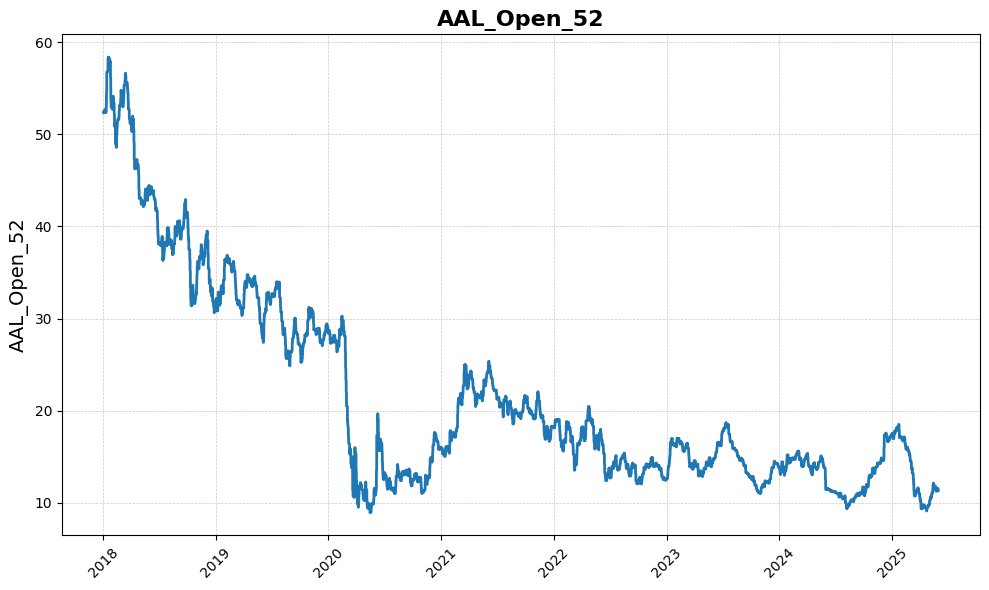

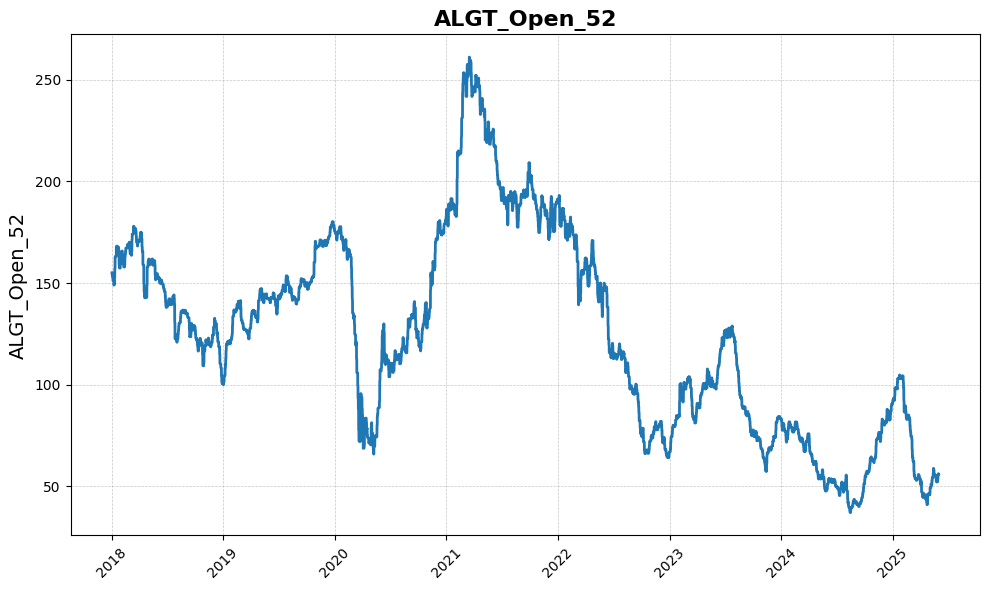

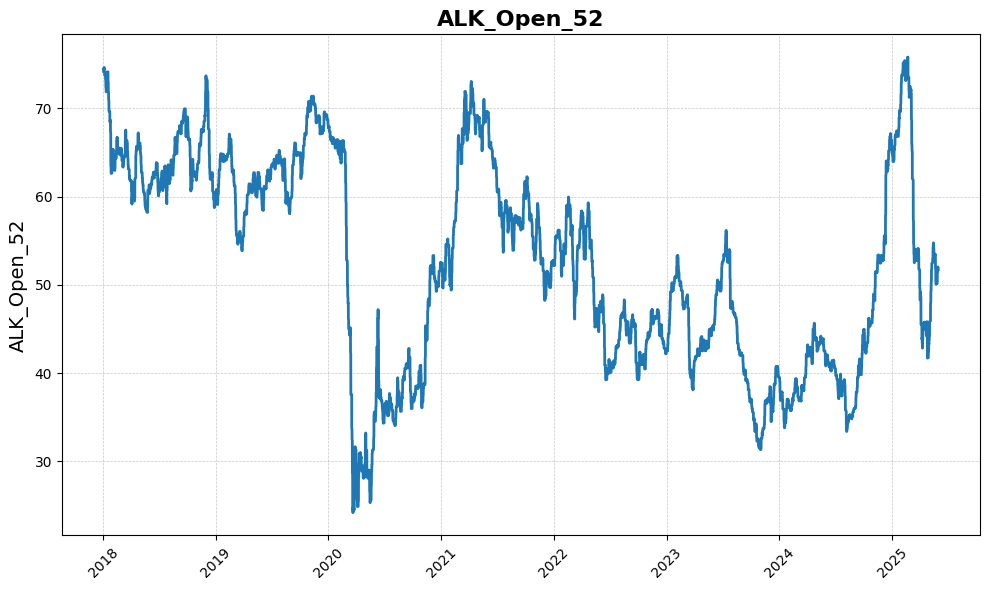

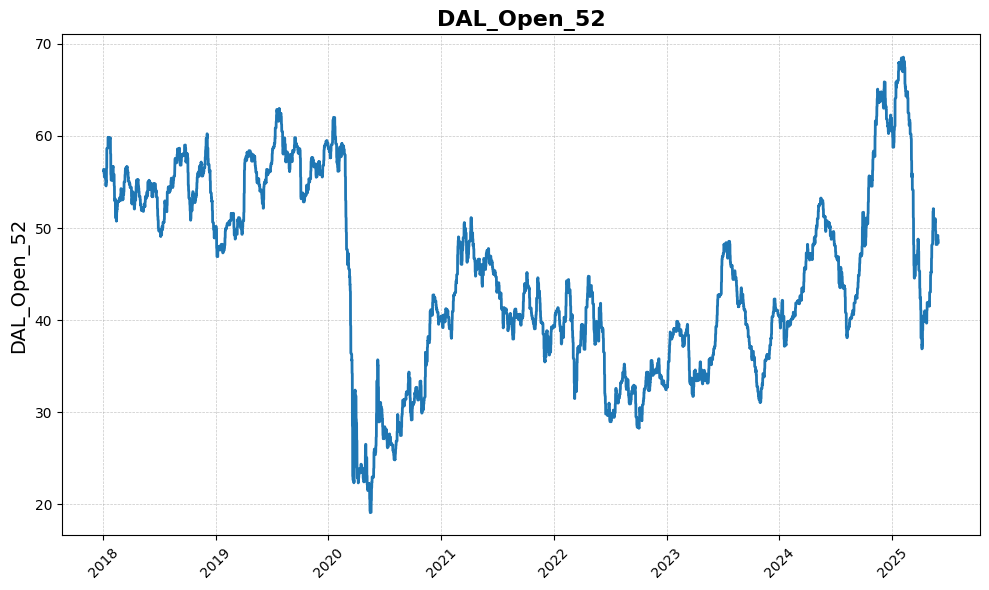

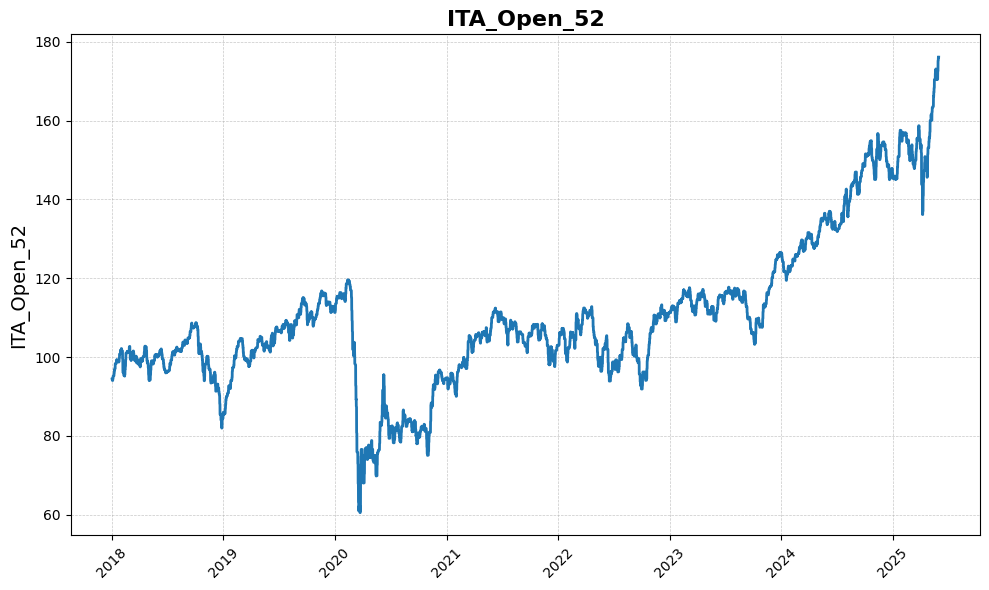

...

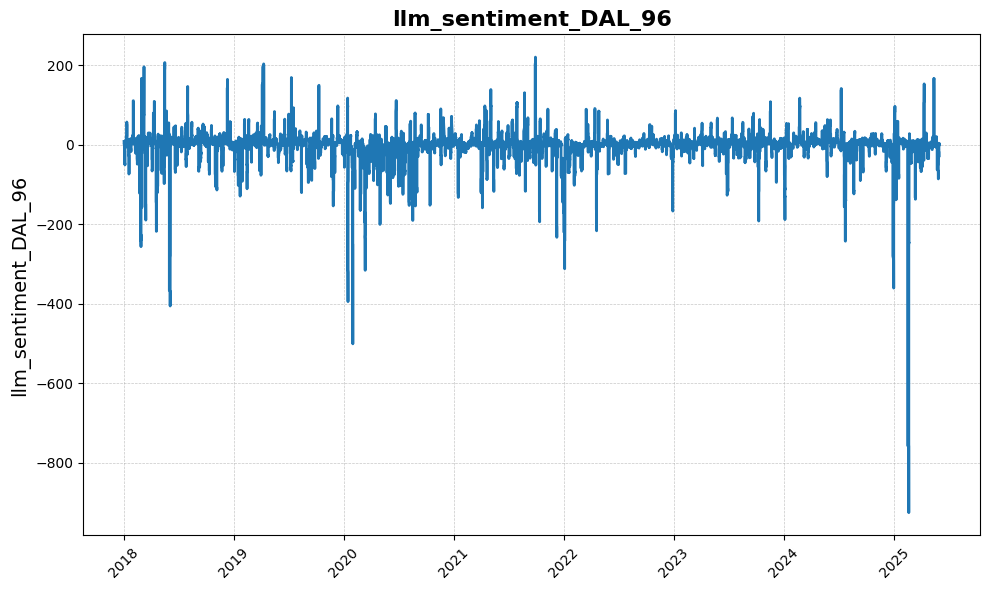

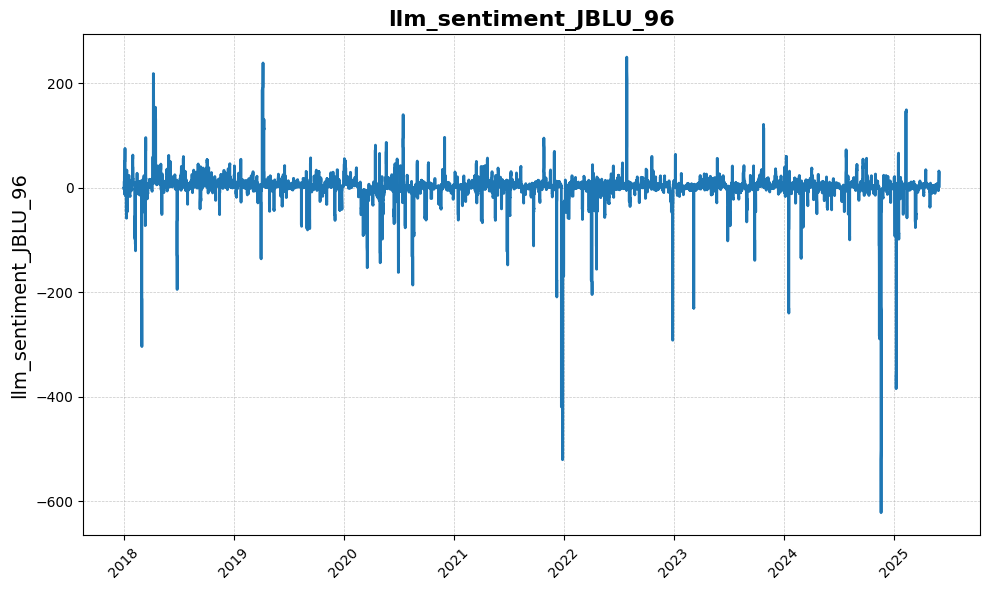

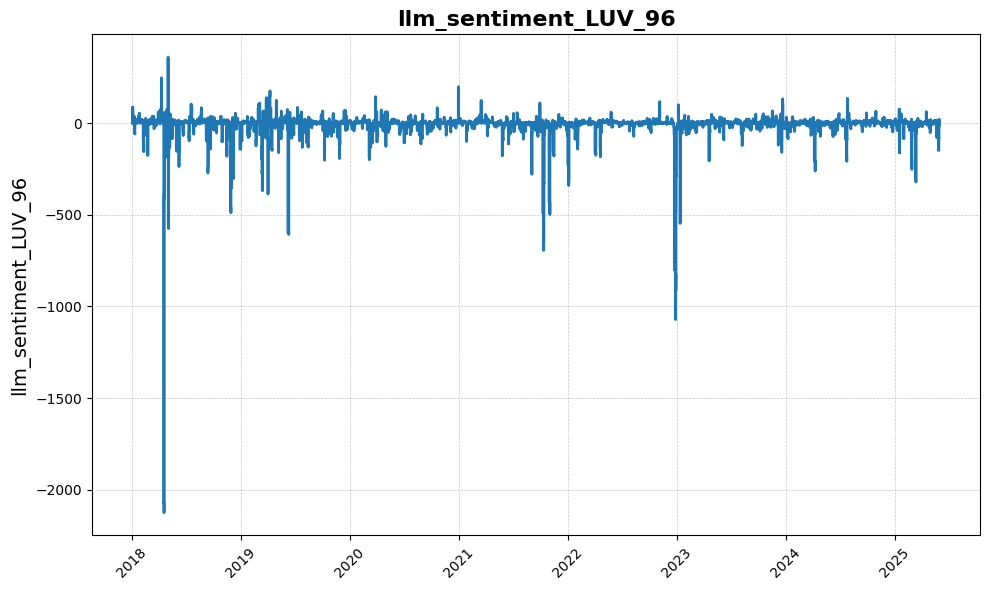

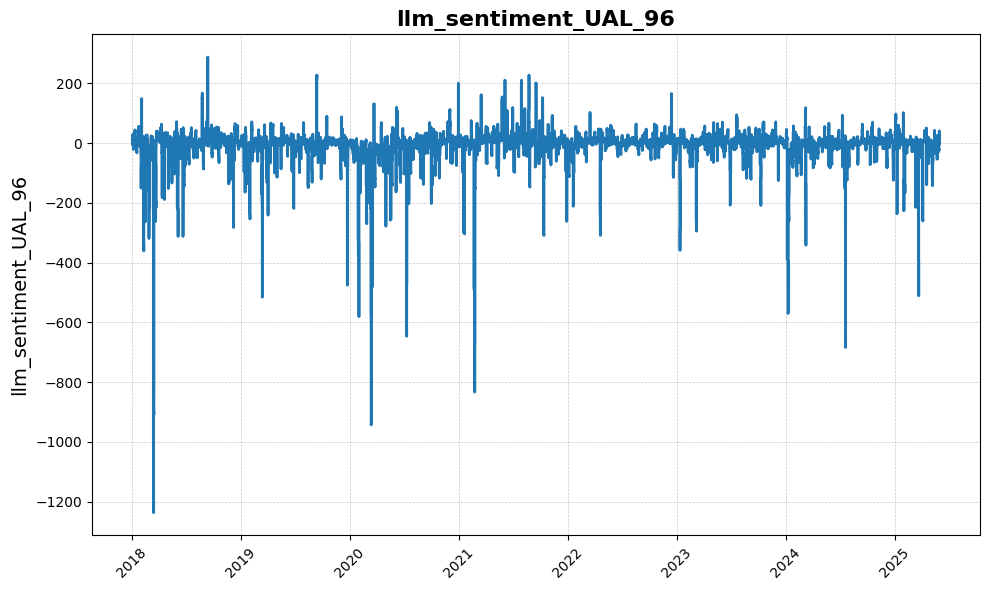

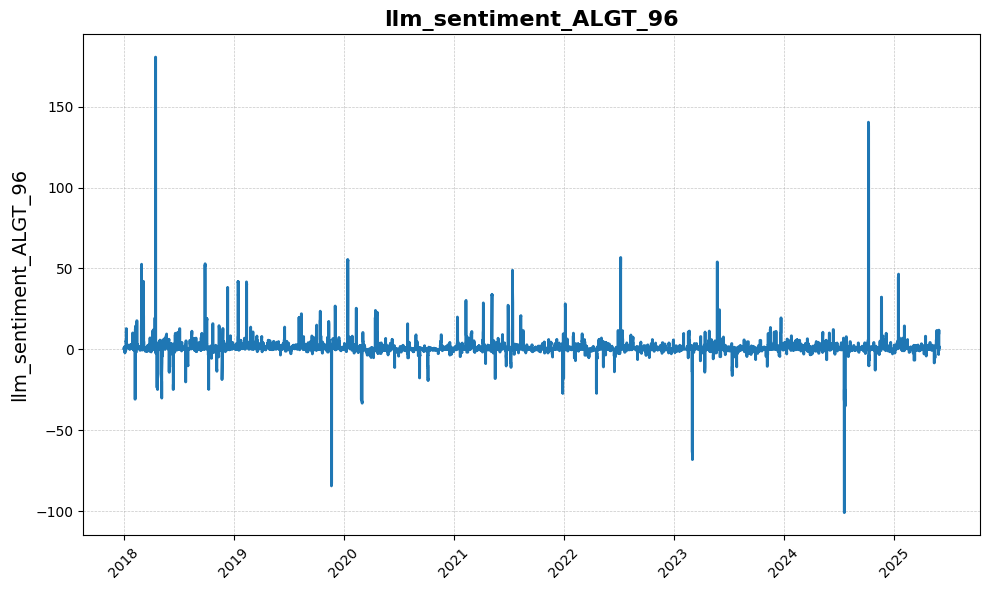

In [32]:
for p in to_plot:

    plot_variable_over_time(
        df, 
        'time', 
        p, 
        title=p, 
        ylabel=p,
        filepath=f'../../output/plots/{p}_over_time.png'
        )

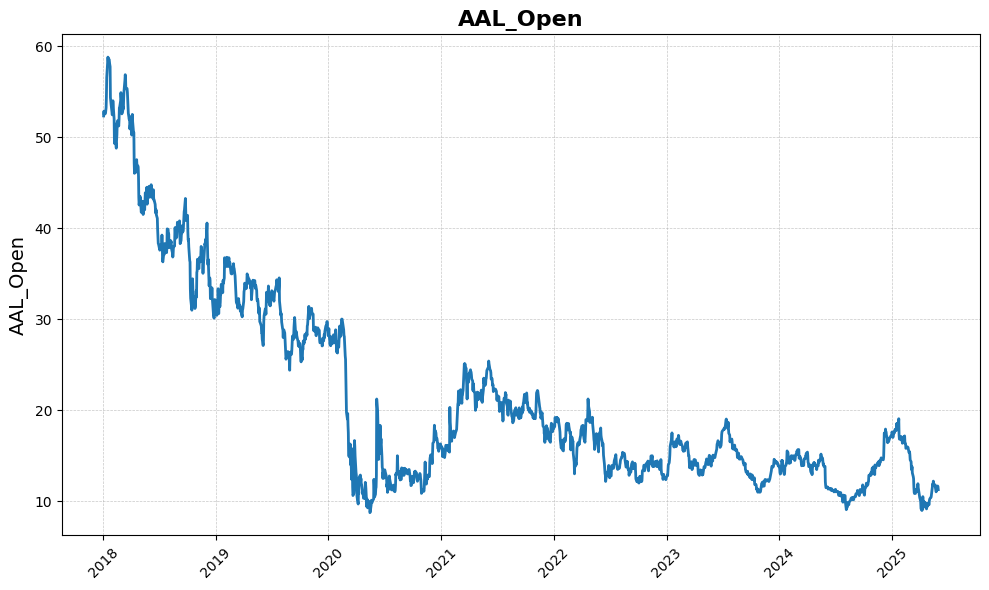

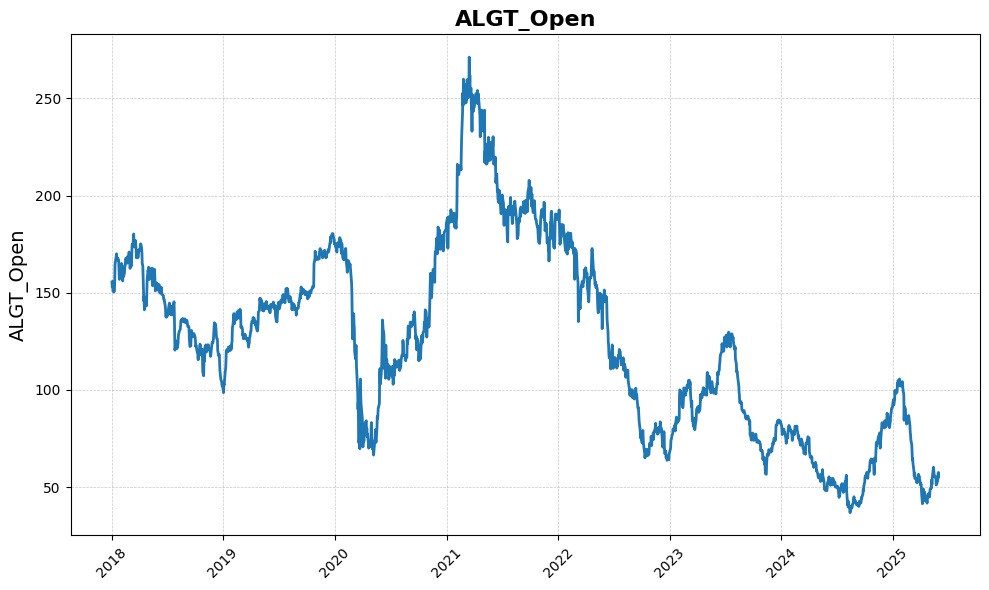

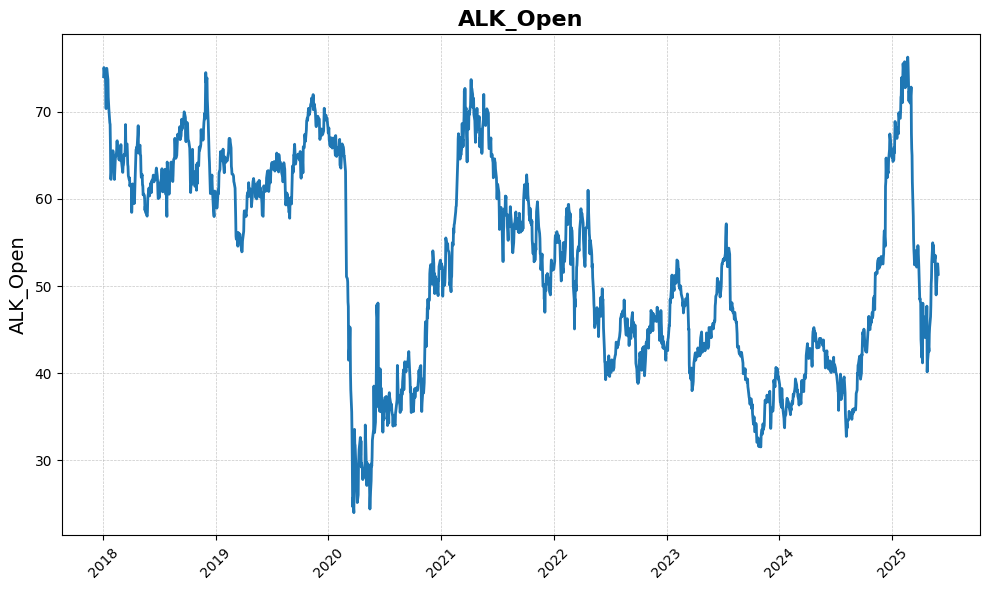

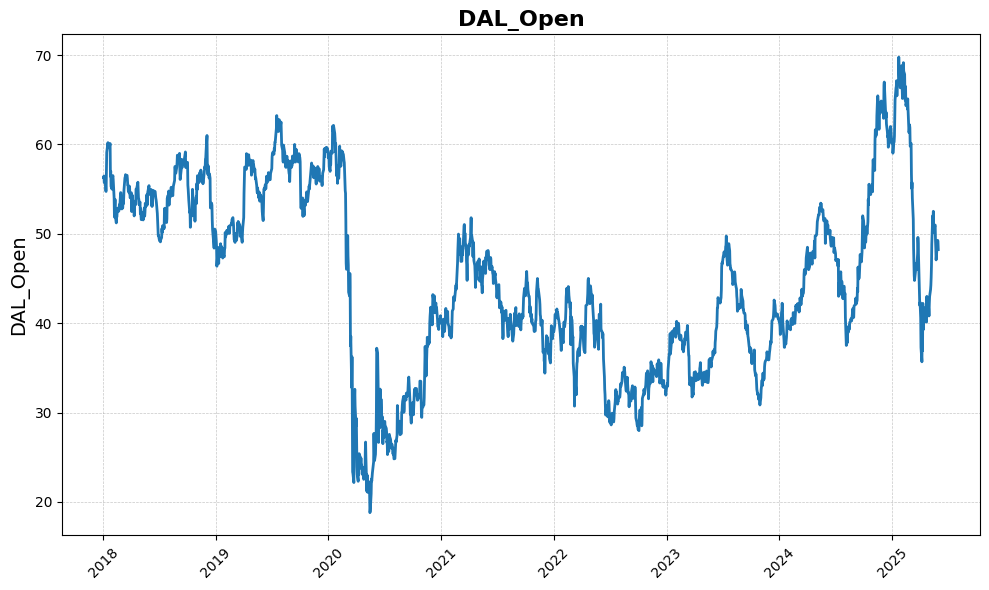

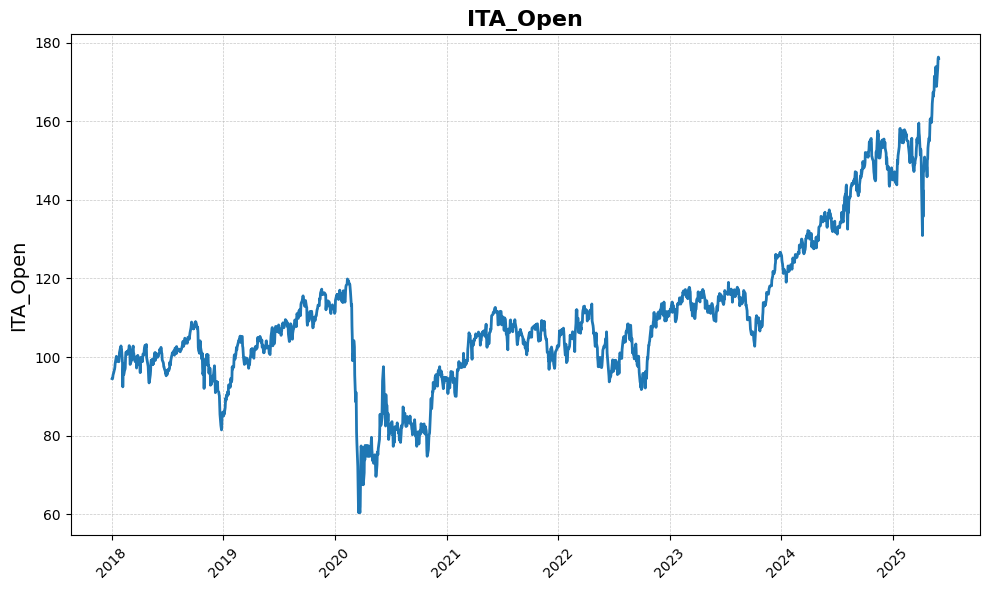

...

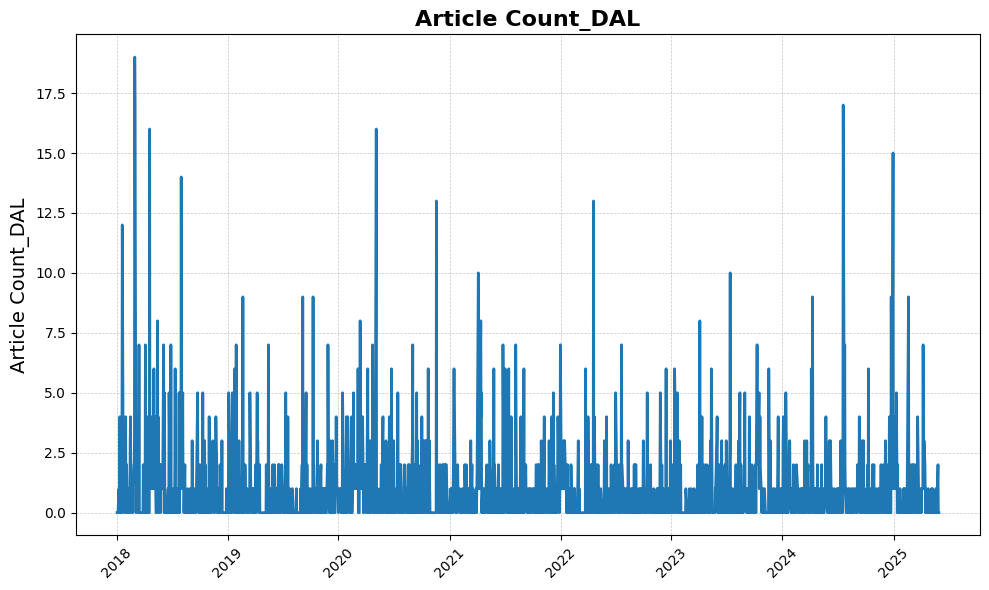

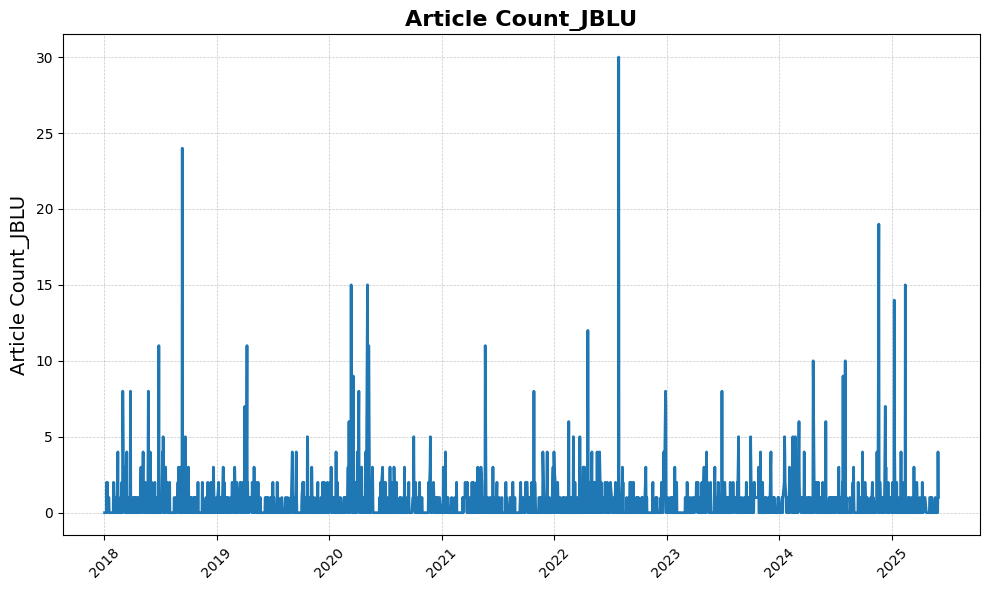

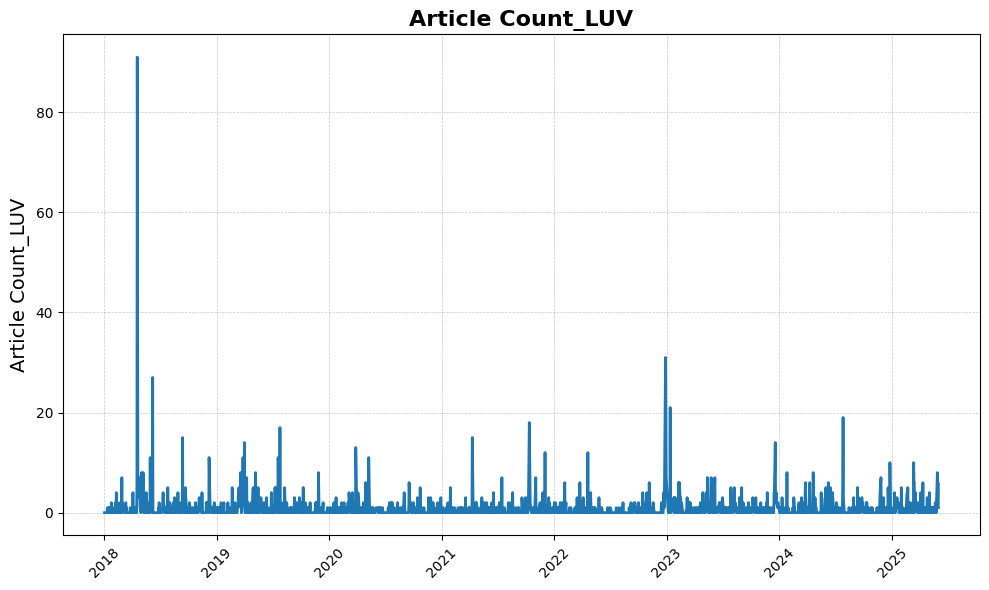

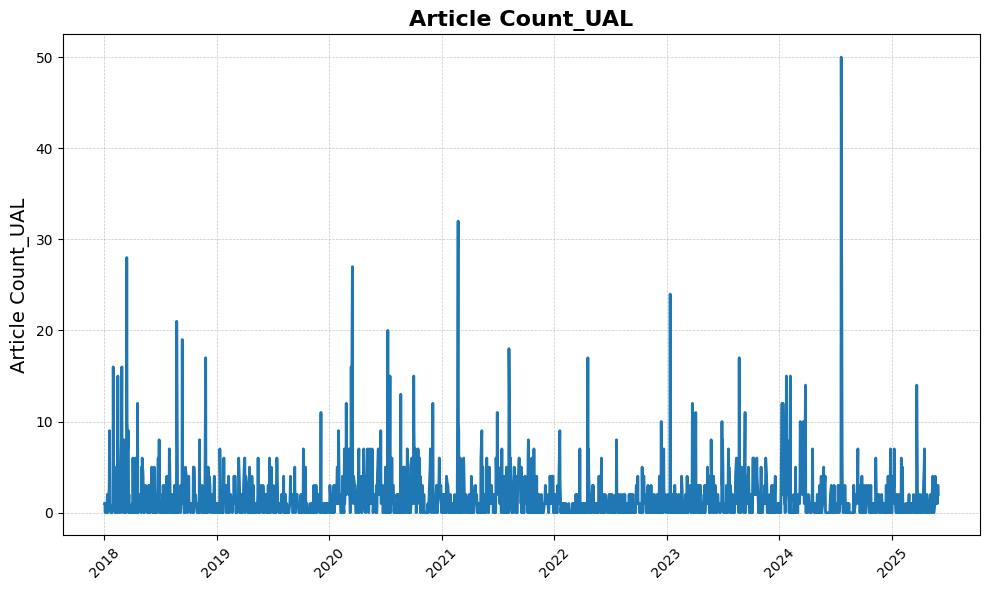

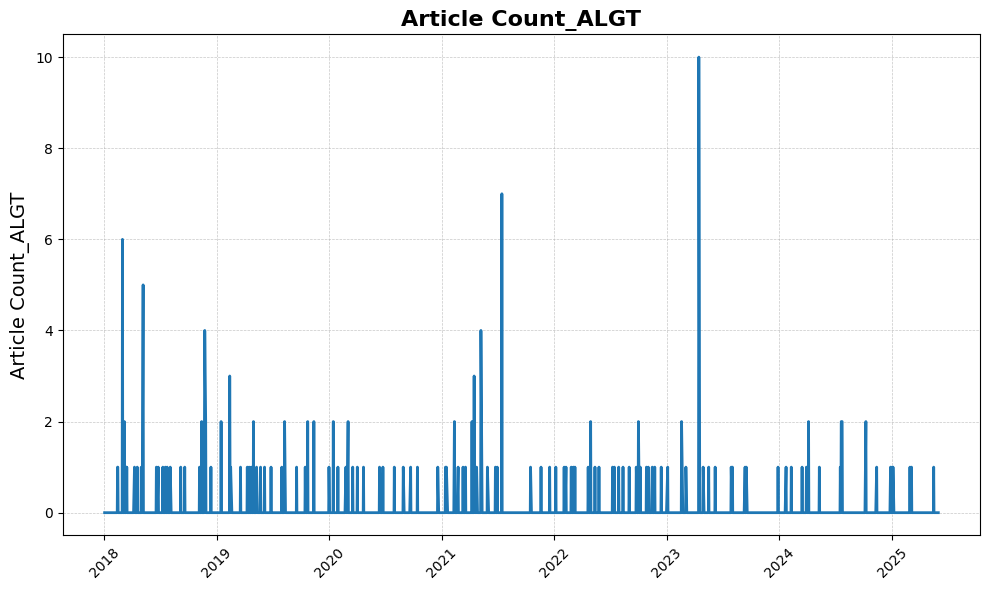

In [28]:
df_filter = df[df['is_open']==1].copy()

for p in to_plot:

    plot_variable_over_time(
        df_filter, 
        'time', 
        p, 
        title=p, 
        ylabel=p,
        filepath=f'../../output/plots/{p}_over_time_market_open.png'
        )

In [ ]:
# Create a dataframe with AAL returns
aal_returns = pd.DataFrame({
    'returns': stock_data.filter(like='AAL_Change').iloc[:, 0]
})

# Extract time of day from the index
aal_returns['time_of_day'] = aal_returns.index.strftime('%H:%M')

# Group by time of day and calculate statistics
time_stats = aal_returns.groupby('time_of_day')['returns'].agg([
    ('mean', 'mean'),
    ('median', 'median'),
    ('q25', lambda x: x.quantile(0.25)),
    ('q75', lambda x: x.quantile(0.75))
]).reset_index()

# Sort by time of day
time_stats['time_obj'] = pd.to_datetime(time_stats['time_of_day'], format='%H:%M').dt.time
time_stats = time_stats.sort_values('time_obj')

# Create the seasonality plot
plt.figure(figsize=(16, 8))

# Plot the mean
plt.plot(time_stats['time_of_day'], time_stats['mean'], 'b-', linewidth=2, label='Mean')

# Plot the interquartile range as a shaded area
plt.fill_between(
    time_stats['time_of_day'], 
    time_stats['q25'], 
    time_stats['q75'], 
    color='blue', 
    alpha=0.2, 
    label='Interquartile Range'
)

# Add a horizontal line at y=0
plt.axhline(y=0, color='gray', linestyle='-', alpha=0.5)

# Format the plot
plt.title('Intraday Seasonality of AAL Stock Returns (15-minute intervals)', fontsize=16)
plt.xlabel('Time of Day', fontsize=14)
plt.ylabel('Change in Price', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.legend()

# Only show every other x-tick to avoid crowding
plt.xticks(time_stats['time_of_day'][::2])
plt.tight_layout()
plt.show()